In [1]:
import torch
from torchvision.io import read_video
import random 
from glob import glob
videos = glob("/home/c1l1mo/datasets/new_boxing_carl/no_back_processed_videos/*.mp4")

rand = random.randint(0,len(videos))

vid, _ , _ = read_video(videos[rand],pts_unit="sec")
vid = vid.permute(0,3,1,2)
frame = vid[0].permute(1,2,0)
frame.shape

/home/c1l1mo/.local/lib/python3.7/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


torch.Size([224, 224, 3])

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-2hl31bnn because the default path (/home/c1l1mo/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


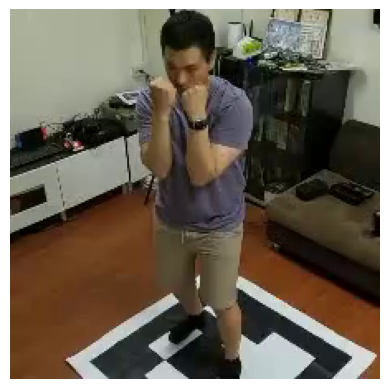

In [2]:
import matplotlib.pyplot as plt
# Display the image
plt.imshow(frame)
plt.axis('off')  # Turn off axis numbering
plt.show()

In [3]:
import torch
import random
frames = vid.clone()
# Assuming 'frames' is your tensor with shape (T, 3, 224, 224)
T, C, H, W = frames.shape

# Size of the corner region to be zeroed out
corner_size = 50

# Randomly select some frames to modify
# num_frames_to_modify = T // 2  # Modify half of the frames, for example
# frames_to_modify = random.sample(range(T), num_frames_to_modify)

#for t in frames_to_modify:
# Top-left corner
frames[:, :, :corner_size, :corner_size] = 0

# Top-right corner
frames[:, :, :corner_size, -corner_size:] = 0

# Bottom-left corner
frames[:, :, -corner_size:, :corner_size] = 0

# Bottom-right corner
frames[:, :, -corner_size:, -corner_size:] = 0
mod_frame = frames[0].permute(1,2,0)

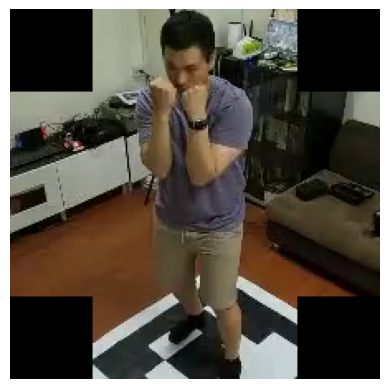

In [4]:
plt.imshow(mod_frame)
plt.axis('off')  # Turn off axis numbering
plt.show()

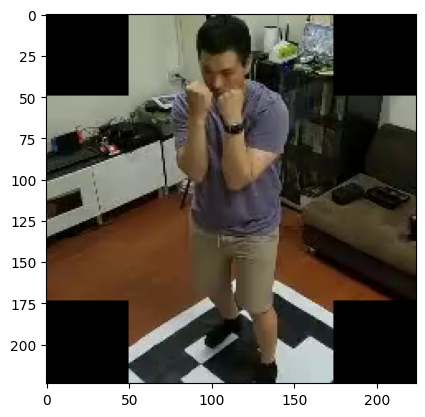

In [5]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots()
im = ax.imshow(frames[0].permute(1,2,0))

def animate(i):
    im.set_data(frames[i].permute(1,2,0))
    return [im]

anim = FuncAnimation(fig, animate, frames=vid.size(0), interval=50)  # Adjust interval for frame rate

# To display the animation in the notebook
HTML(anim.to_jshtml())